## Исследование рынка заведений общественного питания Москвы

**Цель** - сформировать рекомендации по результатам исследования в отношении открытия нового заведения.

**Задача** - оценить данные по рынку за 2022 г, выявить особенности, закономерности.

В нашем распоряжении файл moscow_places.csv, содержащий следующие данные:

* name — название заведения;
* address — адрес заведения;
* category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
* hours — информация о днях и часах работы;
* lat — широта географической точки, в которой находится заведение;
* lng — долгота географической точки, в которой находится заведение;
* rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
* price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
* avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
«Средний счёт: 1000–1500 ₽»;
«Цена чашки капучино: 130–220 ₽»;
«Цена бокала пива: 400–600 ₽».
и так далее;
* middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
* middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»;
* chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым:
0 — заведение не является сетевым
1 — заведение является сетевым;
* district — административный район, в котором находится заведение, например Центральный административный округ;
* seats — количество посадочных мест.

**План:**
* Шаг 1. Изучение общей информации по представленным данным.
* Шаг 2. Предобработка данных.
* Шаг 3. Анализ данных. В т.ч. :
     - оценка заведений в разрезе категорий(доли от общего числа, сетевая принадлежность,популярность, посадочные места);
     - оценка заведений в разрезе округов( особенность расположения, популярность).
* Шаг 4. Детализация исследования. Цель - формирование рекомендаций по открытию кофейни.

In [1]:
# выгрузим все необходимые библиотеки

import pandas as pd
import numpy as np
import math as mth
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from plotly import graph_objects as go
import plotly.io as pio
pio.renderers.default = "png"
import scipy.stats as stats
from datetime import datetime, timedelta
import folium
import warnings; warnings.filterwarnings(action='ignore')

In [2]:
try:
    places = pd.read_csv('moscow_places.csv')
except:
    path = 'https://code.s3.yandex.net/datasets/moscow_places.csv'
    places = pd.read_csv(path)

#### Шаг 1. Изучение общей информации по представленным данным.

In [3]:
# Создадим функцию, чтобы была возможность в один шаг увидеть всю общую информацию

def common_info(df):
    df.info() 
    print('\nПервые строки')
    display(df.head(10)),
    print('Пропуски'),
    display(df.isna().sum()),
    print('Дубликаты'),
    display(df.duplicated().sum()
           )

In [4]:
common_info(places)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB

Первые строки


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


Пропуски


name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Дубликаты


0

**При первичной оценке отмечаем:**

- в нашем распоряжении 8406 записи,
- отсуствие явных/полных дубликатов,
- наличие пропусков в столбцах: hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats.

#### Шаг 2. Предобработка данных.

In [5]:
# первым шагом приведем значения 2-ух столбцов к нижнему регистру, с целью последующего исключения дубликатов
places['name'] = places['name'].str.lower()
places['category'] = places['category'].str.lower()

In [6]:
display(places.head(15))

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,sergio pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,mr. уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,donna maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


In [7]:
# убедимся в отсутвии неявных дубликатов
places.duplicated(subset=['name', 'address']).sum()

3

In [8]:
places[places.duplicated(subset=['name', 'address'])]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


In [9]:
places.groupby(['name', 'address']).agg({'category':'count'}).sort_values(by='category',ascending=False)

,,category
name,address,
хлеб да выпечка,"Москва, Ярцевская улица, 19",2
раковарня клешни и хвосты,"Москва, проспект Мира, 118",2
more poke,"Москва, Волоколамское шоссе, 11, стр. 2",2
навруз,"Москва, Новоясеневский проспект, 1Б, корп. 2",1
на углях,"Москва, 5-я Кабельная улица, 8",1
...,...,...
бенвенуто,"Москва, Сретенский бульвар, 6/1с1",1
беляшерия,"Москва, Тестовская улица, 1",1
бельгийская брассери 0.33,"Москва, Орликов переулок, 2/17",1


In [10]:
# избавимся от найденных дубликатов
places = places.drop_duplicates \
    (subset=['name','address'], keep='first',inplace = False, ignore_index = False)

In [11]:
# при просмотре значений  в столбце name были отмечены аналогичные заведения, записанные в разном формате - внесем исправления
places['name'] = places['name'].replace(["домино'с пицца","домино'с"],'доминос пицца')
places['name'] = places['name'].replace("it's сот-кофейня","it's сот - кофейня")
places['name'] = places['name'].replace('corner cafe&kitchen','corner cafe & kitchen')
places['name'] = places['name'].replace('mainfood','main food')

In [12]:
# проверим, что все заведения, отнесенные к сетям имеют хотя бы 2 точки
chains_check = places.query('chain == 1').groupby('name').agg({'chain' : 'sum'}).sort_values(by='chain', ascending=True)
display(chains_check)
# нашли исключения
check = chains_check.query('chain == 1')
#places['chain'] = np.where((places['chain'] == 1) & (places['name'].isin(check.index)), 0, places['chain'])

#позднее ликвидирую данную запись

,chain
name,
1-я креветочная,1
лагман,1
сказка,1
halal food,1
крепери,1
...,...
яндекс лавка,69
one price coffee,71
додо пицца,74


In [13]:
# для дальнейшего анализа нам потребуется работать в разрезе сетевые/несетевые заведения, для удобство изменим значения в 
# столбце на булев тип
places.loc[places['chain'] == 0,'chain'] = False
places.loc[places['chain'] == 1,'chain'] = True

In [14]:
# перейдем к пропускам
# еще раз посмотрим какие именно столбцы содержат пропуски,чтобы в дальнейшем решить где они могут быть адекватно заполнены

display(places.isna().sum())

name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5088
avg_bill             4587
middle_avg_bill      5254
middle_coffee_cup    7868
chain                   0
seats                3611
dtype: int64

* hours -  нельзя заполнить произвольно, точечный поиск может отнять очень много времени;
* seats - не корректно пытаться заполнять, т.к. это могут быть заведения работающие на вынос - кофе/булочная, возможно, при объединении в сети будет возможность заполнить часть пропусков внутри сети;
* price - попробуем понять какие значения попадают в ту или иную группу для заполнения пропусков;
* avg_bill - нельзя заполнить произвольно, точечный поиск может отнять очень много времени;
* middle_avg_bill и middle_coffee_cup получаются на основании avg_bill, если найти где avg_bill не NAN, а указанные столбцы с пропусками можем заполнить.

In [15]:
# Для начала рассмотрим как распределны значения в middle_avg_bill и middle_coffee_cup
display(places.describe())

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,seats
count,8403.000000,8403.000000,8403.000000,3149.000000,535.000000,4792.000000
mean,55.750096,37.608604,4.229894,958.053668,174.721495,108.361436
std,0.069664,0.098583,0.470426,1009.732845,88.951103,122.841130
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000
25%,55.705018,37.538637,4.100000,375.000000,124.500000,40.000000
50%,55.753407,37.605260,4.300000,750.000000,169.000000,75.000000
75%,55.795028,37.664810,4.400000,1250.000000,225.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1288.000000


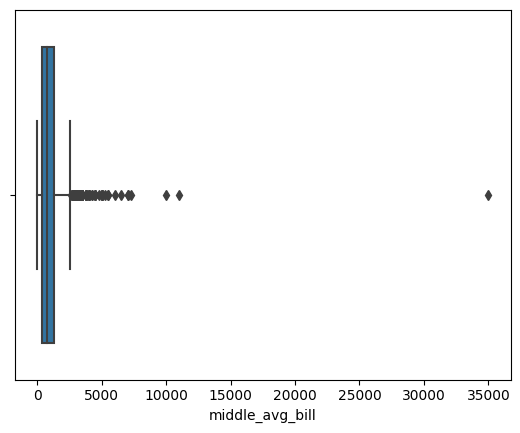

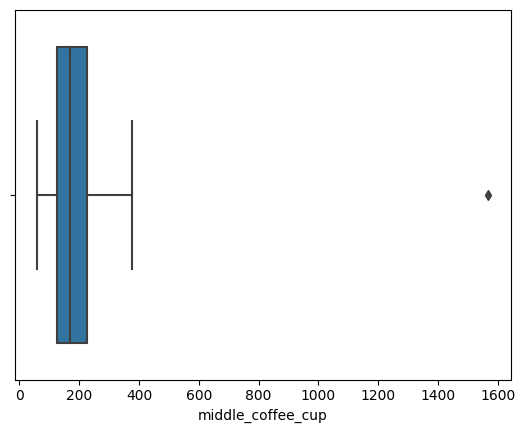

In [16]:
sns.boxplot(x=places['middle_avg_bill'])
plt.show()
sns.boxplot(x=places['middle_coffee_cup']);

In [17]:
# отбросим явные вбросы
places_filtered = places.query('middle_avg_bill <= 15000 or middle_coffee_cup <= 400 or avg_bill!=avg_bill')
places_filtered

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,False,NaN
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,False,4.0
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,False,45.0
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,False,NaN
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,True,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,суши мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,False,86.0
8402,миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,False,150.0
8403,самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,False,150.0
8404,чайхана sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,True,150.0


In [18]:
# вновь оценим данные после того, как убрали вбросы
display(places_filtered.info())
display(places_filtered.describe())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8269 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8269 non-null   object 
 1   category           8269 non-null   object 
 2   address            8269 non-null   object 
 3   district           8269 non-null   object 
 4   hours              7735 non-null   object 
 5   lat                8269 non-null   float64
 6   lng                8269 non-null   float64
 7   rating             8269 non-null   float64
 8   price              3197 non-null   object 
 9   avg_bill           3682 non-null   object 
 10  middle_avg_bill    3148 non-null   float64
 11  middle_coffee_cup  534 non-null    float64
 12  chain              8269 non-null   object 
 13  seats              4708 non-null   float64
dtypes: float64(6), object(8)
memory usage: 969.0+ KB


None

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,seats
count,8269.000000,8269.000000,8269.000000,3148.000000,534.000000,4708.000000
mean,55.750062,37.608460,4.225130,947.239835,172.112360,108.692863
std,0.069848,0.098814,0.471854,807.171927,65.408333,123.549071
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000
25%,55.704635,37.538215,4.100000,375.000000,124.250000,40.000000
50%,55.753180,37.604930,4.300000,750.000000,168.000000,75.000000
75%,55.795329,37.664941,4.400000,1250.000000,225.000000,140.000000
max,55.928943,37.874466,5.000000,11000.000000,375.000000,1288.000000


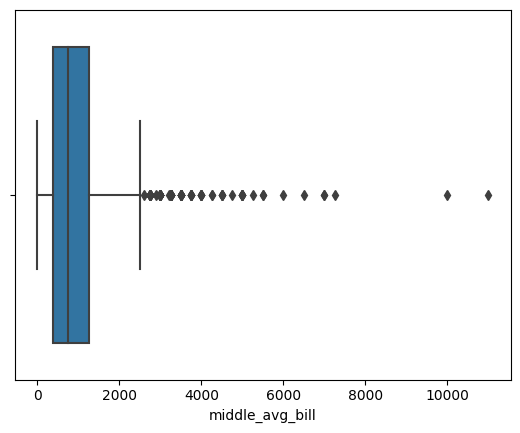

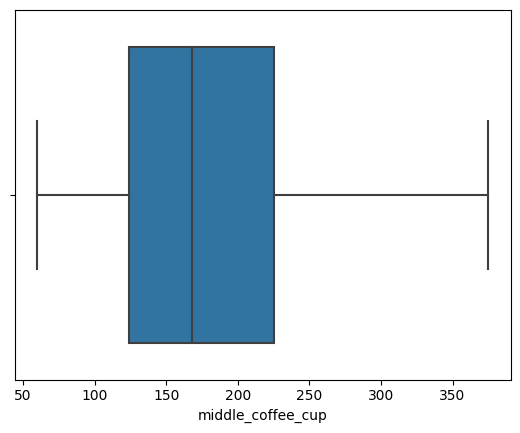

In [19]:
sns.boxplot(x=places_filtered['middle_avg_bill'])
plt.show()
sns.boxplot(x=places_filtered['middle_coffee_cup']);

In [20]:
# попробуем заполнить price
# идея - посмотреть как диапазон цен относят к той или иной категории

about_price = places_filtered \
    .pivot_table(
    index='price', 
    values='middle_coffee_cup', 
    aggfunc={'middle_coffee_cup': ('max', 'median')}
)
display(about_price)

,max,median
price,,
высокие,250.0,250.0
выше среднего,256.0,203.0
низкие,256.0,139.0
средние,328.0,200.0


In [21]:
about_price_2 = places_filtered\
    .pivot_table(
    index='price', 
    values='middle_avg_bill', 
    aggfunc={'middle_avg_bill': 'max'}
)
about_price_2

,middle_avg_bill
price,
высокие,11000.0
выше среднего,4500.0
низкие,600.0
средние,2150.0


по заполнению принято решение:

* значение price при наличии данных middle_coffee_cup будем заполнять на основании median, учитывая полученный разброс;

* значение price при наличии данных middle_avg_bill будем заполнять на основании max.

In [22]:
# с целью заполнения пропусков напишем функцию
def categorize_price(row):
    bill = row['middle_avg_bill']
    cup = row['middle_coffee_cup']
    
    if pd.notna(bill):
        if bill <= 600:
            return 'низкие'
        elif 600 < bill <= 2150:
            return 'средние'
        elif 2150 < bill <= 4500 :
            return 'выше среднего'
        else:
            return 'высокие'
    else:
        if cup <= 150:
            return 'низкие'
        elif 151 < cup <= 200:
            return 'средние'
        elif 201 < cup <= 250 :
            return 'выше среднего'
        else:
            return 'высокие'
    
places_filtered['price'] = places_filtered.apply(categorize_price, axis=1)
places_filtered

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,высокие,NaN,NaN,NaN,False,NaN
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,средние,Средний счёт:1500–1600 ₽,1550.0,NaN,False,4.0
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,False,45.0
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,средние,Цена чашки капучино:155–185 ₽,NaN,170.0,False,NaN
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,низкие,Средний счёт:400–600 ₽,500.0,NaN,True,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,суши мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,высокие,NaN,NaN,NaN,False,86.0
8402,миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,высокие,NaN,NaN,NaN,False,150.0
8403,самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,низкие,Средний счёт:от 150 ₽,150.0,NaN,False,150.0
8404,чайхана sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,высокие,NaN,NaN,NaN,True,150.0


In [23]:
# внесем дополнительный столбцец для последующего исследования - извлечем улицу из адреса
def take_street(row):
    address = row['address'].split(', ')
    street = address[1]
    return street

In [24]:
places_filtered['street_name'] = places_filtered.apply(take_street, axis=1)

In [25]:
display(places_filtered.head())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street_name
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,высокие,NaN,NaN,NaN,False,NaN,улица Дыбенко
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,средние,Средний счёт:1500–1600 ₽,1550.0,NaN,False,4.0,улица Дыбенко
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,False,45.0,Клязьминская улица
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,средние,Цена чашки капучино:155–185 ₽,NaN,170.0,False,NaN,улица Маршала Федоренко
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,низкие,Средний счёт:400–600 ₽,500.0,NaN,True,148.0,Правобережная улица


In [26]:
# также создадим доп.столбец, имеющий булев тип, с информацией работает ли завдеение 24/7 или нет

places_filtered['is_24/7'] = (
    places_filtered['hours'].str.contains('круглосуточно', na=False) & \
    places_filtered['hours'].str.contains('ежедневно', na=False)
)
places_filtered.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street_name,is_24/7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,высокие,NaN,NaN,NaN,False,NaN,улица Дыбенко,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,средние,Средний счёт:1500–1600 ₽,1550.0,NaN,False,4.0,улица Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,False,45.0,Клязьминская улица,False
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,средние,Цена чашки капучино:155–185 ₽,NaN,170.0,False,NaN,улица Маршала Федоренко,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,низкие,Средний счёт:400–600 ₽,500.0,NaN,True,148.0,Правобережная улица,False


**По результатам предобработки данных:** 

- столцы name и category приведены к нижнему регистру;
- обнаруженные неявные дубликаты удалены;
- внесены исправления в запись названий аналогичных заведений;
- произведена фильтрация на основании отмеченных вбросов в столбцах middle_avg_bill и middle_coffee_cup;
- заполнены пропуски в столбце price;
- добавлено 2 новых столбца: название улицы + выделение заведений с графиком 24/7.

#### Шаг 3. Анализ данных.

**Посмотрим, какие категории заведений представлены в данных, исследуем количество объектов общественного питания по категориям, построим визуализацию.**

In [27]:
places_to_category = places_filtered.groupby('category')['name'].count().sort_values(ascending=False).reset_index()
places_to_category['percent_of_main']= round(places_to_category['name'] / places_to_category['name'].sum() *100,2)
places_to_category

,category,name,percent_of_main
0,кафе,2377,28.75
1,ресторан,2041,24.68
2,кофейня,1412,17.08
3,"бар,паб",634,7.67
4,пиццерия,631,7.63
5,быстрое питание,603,7.29
6,столовая,315,3.81
7,булочная,256,3.10


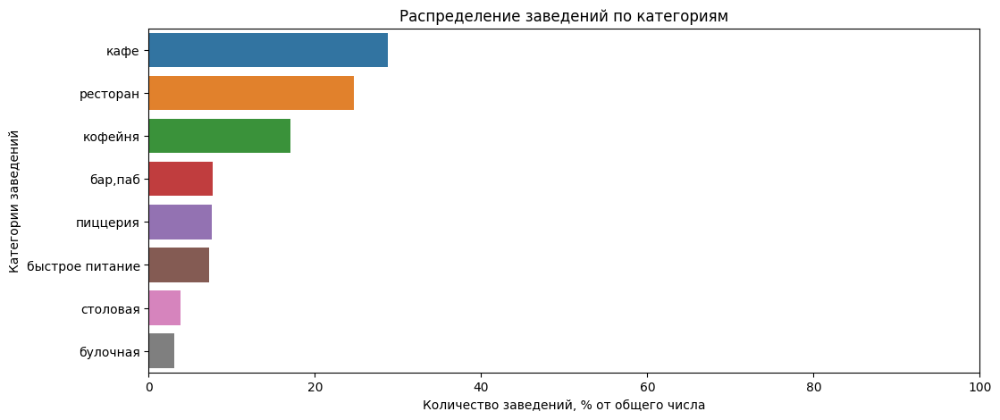

In [28]:
plt.figure(figsize=(12, 5))
ax=sns.barplot(x='percent_of_main', y='category', data=places_to_category)
plt.title('Распределение заведений по категориям')
plt.xlabel('Количество заведений, % от общего числа')
plt.ylabel('Категории заведений')
plt.xlim (0, 100)
# ax.bar_label(ax.containers[0], fmt='%.2f')
plt.show()

**Вывод:** в нашем распоряжении 8 категорий заведений:

* кафе
* ресторан	
* кофейня
* бар,паб	
* пиццерия	
* быстрое питание	
* столовая
* булочная	

Лидер по количеству - заведения категории **"кафе" - 28.75 %**, с небольшим отставанием, на втором месте  - **"ресторан"**. Наименьшее число заведений представлено в категориях - **"столовая"** и **"булочная".**

**Исследуем количество посадочных мест в местах по категориям, построим визуализации.**

,category,seats_sum,total_count,per_one
0,"бар,паб",50755.0,386,131.49
6,ресторан,154581.0,1268,121.91
4,кофейня,83463.0,750,111.28
7,столовая,16359.0,164,99.75
2,быстрое питание,34513.0,349,98.89
3,кафе,118494.0,1217,97.37
5,пиццерия,40332.0,426,94.68
1,булочная,13229.0,148,89.39


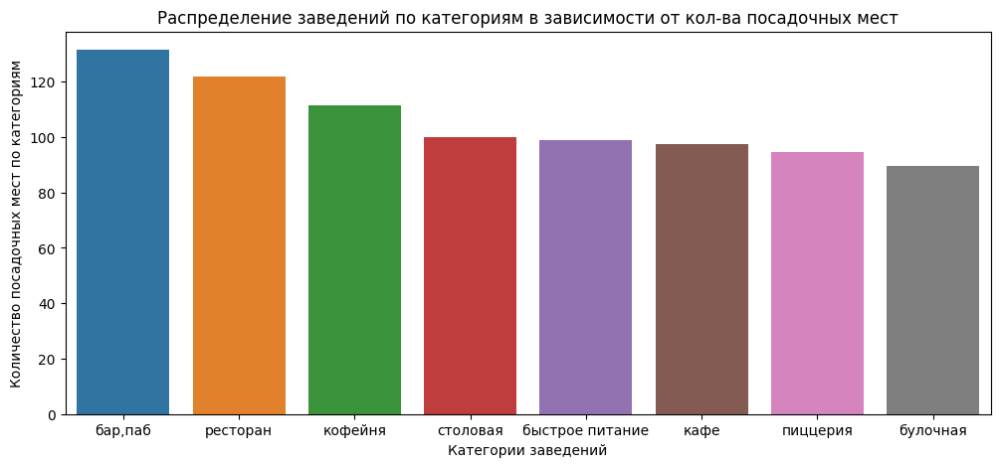

In [29]:
# отфильтруем те заведения, в которых есть посадочные места, посмотрим распределение по категориям

places_to_category_seats_а = places_filtered[places_filtered['seats'].notna()]
places_to_category_seats = places_to_category_seats_а.groupby('category').agg({'seats': 'sum',
                                                                 'name' : 'count'}).reset_index()
places_to_category_seats.columns = ['category', 'seats_sum', 'total_count']
places_to_category_seats['per_one'] = round(places_to_category_seats['seats_sum'] / places_to_category_seats['total_count'],2)
display(places_to_category_seats.sort_values(by='per_one', ascending=False))


plt.figure(figsize=(12, 5))
ax=sns.barplot(x='category', y='per_one', data=places_to_category_seats, \
            order=places_to_category_seats.sort_values(by='per_one', ascending=False).category)
plt.title('Распределение заведений по категориям в зависимости от кол-ва посадочных мест')
plt.xlabel('Категории заведений')
plt.ylabel('Количество посадочных мест по категориям');
# ax.bar_label(ax.containers[0]);

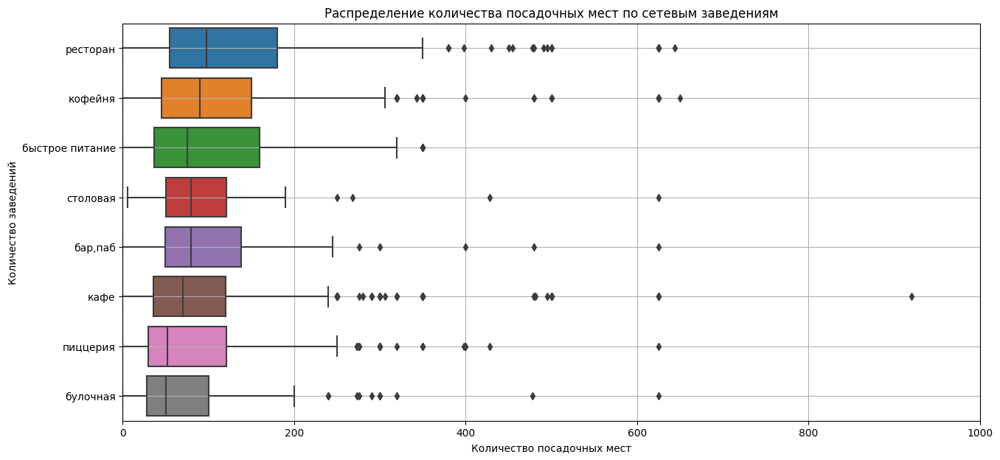

In [30]:
# дополнительно, посмотрим есть ли разница в посадочных местах в разрезе сетевые/несетевые заведения

plt.figure(figsize = (15, 7))
sns.boxplot(x='seats', y='category',data=places_to_category_seats_а.query('chain == True'), \
            order=places_to_category_seats_а.query('chain == True') \
            .groupby('category')['seats'] \
            .agg('mean').sort_values(ascending=False).index)


plt.xlabel('Количество посадочных мест')
plt.xlim(0, 1000)
plt.grid()
plt.ylabel('Количество заведений')
plt.title('Распределение количества посадочных мест по сетевым заведениям')
plt.show()

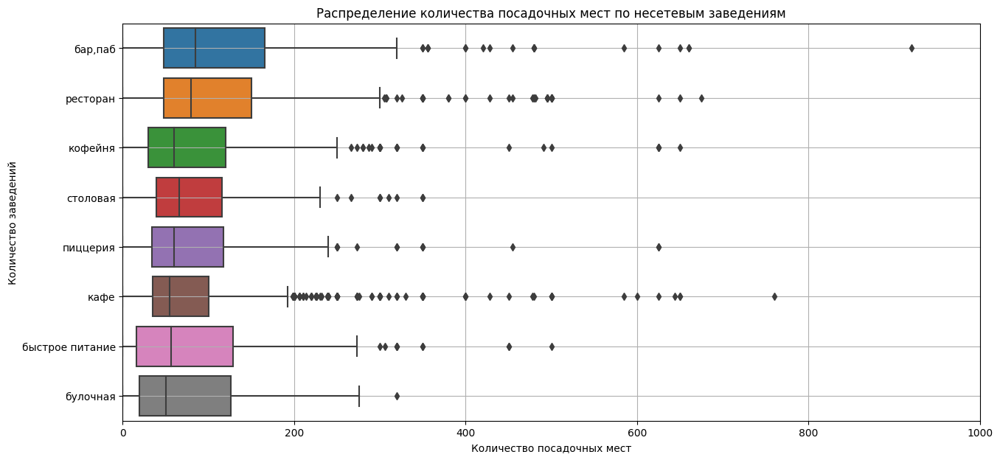

In [31]:
plt.figure(figsize = (15, 7))
sns.boxplot(x='seats', y='category',data=places_to_category_seats_а.query('chain == False'),\
             order=places_to_category_seats_а.query('chain == False') \
            .groupby('category')['seats'] \
            .agg('mean').sort_values(ascending=False).index)
plt.xlabel('Количество посадочных мест')
plt.xlim(0, 1000)
plt.grid()
plt.ylabel('Количество заведений')
plt.title('Распределение количества посадочных мест по несетевым заведениям')
plt.show()

**Вывод:** при общей оценке посадочных мест по категориям лидирует **"бар,паб"**, догоняет - **"ресторан"**. Однако, при оценке в разрезе сетевые/несетевые заведения наибольшее количество мест у сетевых **"ресторанов"** и **"кофейн"**.

**Рассмотрим соотношение сетевых и несетевых заведений.**

In [32]:
chains = places_filtered.groupby('chain')['name'].count().reset_index()
chains

,chain,name
0,False,5083
1,True,3186


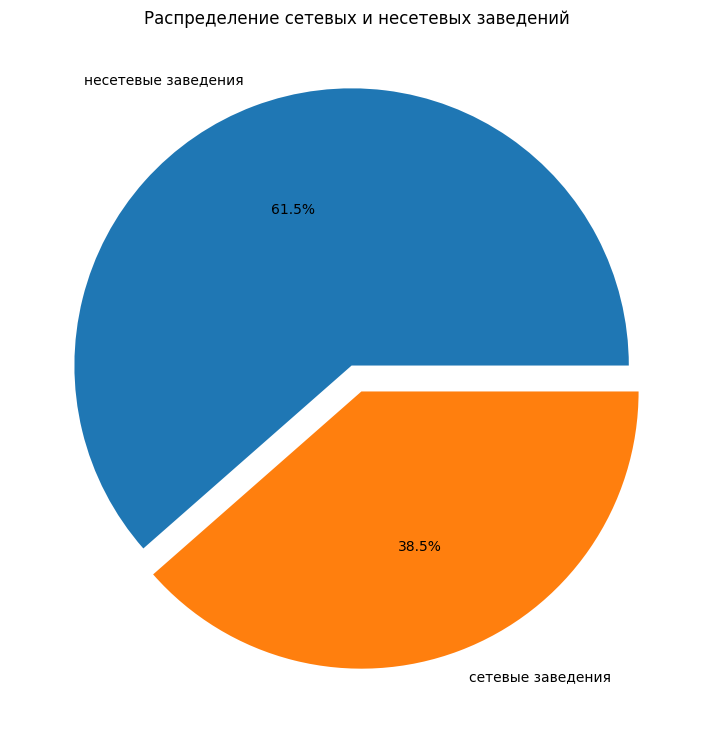

In [33]:
# лидируют несетвые заведения, отобразим результаты на графике

fig1, ax1 = plt.subplots(figsize=(12,9))
explode = (0.05, 0.05)
ax1.pie(chains['name'],labels = chains['chain'].map({True: 'сетевые заведения', False: 'несетевые заведения'}), \
        autopct='%1.1f%%',explode=explode)
ax1.set_title('Распределение сетевых и несетевых заведений');

**Вывод:** в датасете бОльшая часть представленных заведений НЕсетевые, а именно в соотношении - **61,5 %** к **38,5 %.**

**Посмотрим, какие категории заведений чаще являются сетевыми, визуализируем результаты**

In [34]:
chains_to_category = places_filtered.groupby('category').agg({'chain' : 'sum',
                                'name' : 'count'}).reset_index()
chains_to_category.columns = ['category', 'chain_count', 'total_count']
chains_to_category['percent'] = chains_to_category['chain_count'] / chains_to_category['total_count'] * 100
chains_to_category = chains_to_category.sort_values('chain_count', ascending=False)
display(chains_to_category.sort_values(by='percent', ascending=False))

,category,chain_count,total_count,percent
1,булочная,157,256,61.328125
5,пиццерия,330,631,52.29794
4,кофейня,719,1412,50.92068
2,быстрое питание,232,603,38.474295
6,ресторан,729,2041,35.717785
3,кафе,779,2377,32.772402
7,столовая,88,315,27.936508
0,"бар,паб",152,634,23.974763


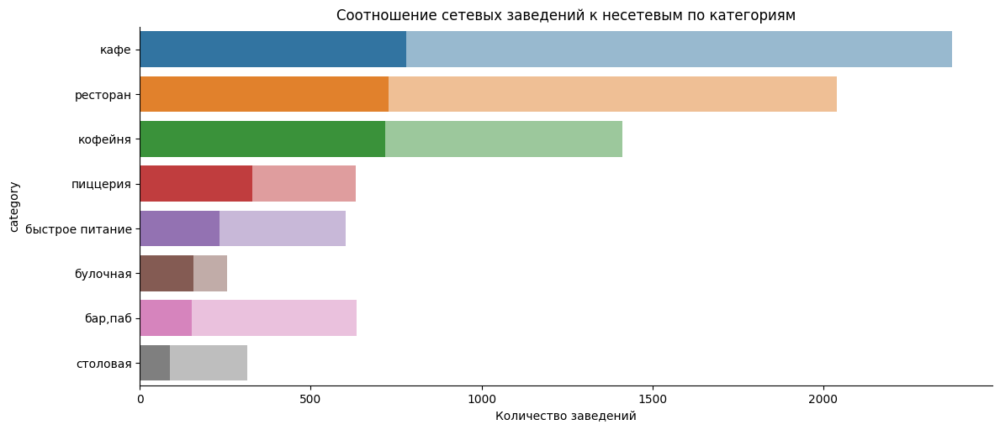

In [35]:
ax = sns.catplot(data=chains_to_category, 
                 kind="bar", 
                 x="chain_count", 
                 y="category",               
                 alpha=1, 
                 aspect=12/5)
ax1 = sns.barplot(x='total_count', y='category', data=chains_to_category, alpha=0.5,  orient='h')
ax.set_axis_labels('Количество заведений')
plt.title('Соотношение сетевых заведений к несетевым по категориям')
plt.show()

**Вывод:** сетевые заведения преобладают только в категории **"булочная" (~ 61 %)**, для категории **"пиццерия"** и **"кофейня"** соотношение **~ 50/50**; для  категорий **"кафе"** и **"ресторан"** сетевых **~ 1/3.** По абсолютному количеству лидирует **"кафе".**

**Сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве. Проанализируем полученные результаты.**

In [36]:
top_15_chain = places_filtered.query('chain == True').groupby('name').agg({'name': 'count'}).\
rename(columns={'name':'count_places'}).sort_values(by='count_places', ascending=False).head(15)

# дополнительный столбец для оценки доли топ-15 по отношению ко всем
top_15_chain['part_of_main,%'] = round(top_15_chain['count_places'] / top_15_chain['count_places'].sum()*100,2)
top_15_chain

,count_places,"part_of_main,%"
name,,
шоколадница,119,14.60
доминос пицца,76,9.33
додо пицца,74,9.08
one price coffee,71,8.71
яндекс лавка,69,8.47
cofix,65,7.98
prime,50,6.13
хинкальная,44,5.40
кофепорт,42,5.15


Посмотрим на лидеров топ-15 сетей на графике

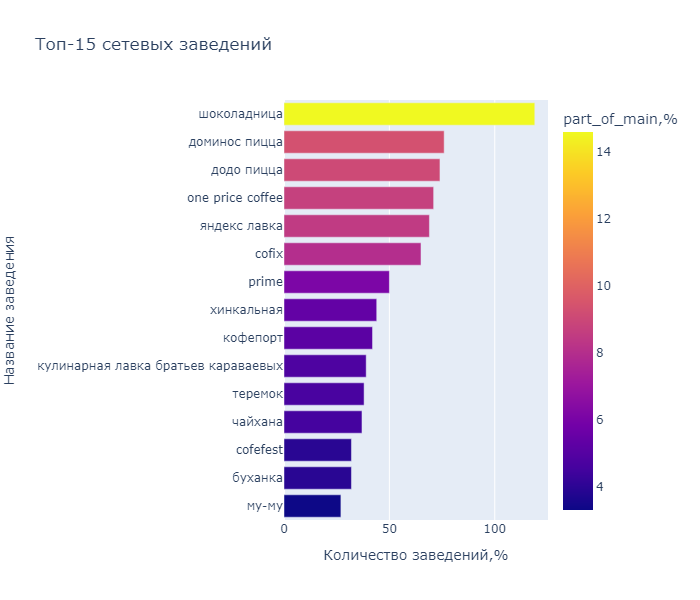

In [37]:
fig = px.bar(top_15_chain, x='count_places', color ='part_of_main,%',width=700,height =600, \
            labels={
                     "count_places": "Количество заведений,%",
                     "name": "Название заведения",
                 },
                title="Топ-15 сетевых заведений")
fig.update_layout(yaxis={'categoryorder':'total ascending'})
fig.show()

In [38]:
# посмотрим на доли заведений топ-15 по категориям
top_15_to_category = places_filtered.query('name in @top_15_chain.index')\
    .groupby('category')\
    .agg({'name':'count'})\
    .reset_index()
top_15_to_category['percent,%'] = round(top_15_to_category['name']/top_15_to_category['name'].sum()*100,2)
top_15_to_category.sort_values(by='percent,%', ascending= False)

,category,name,"percent,%"
4,кофейня,336,41.03
6,ресторан,186,22.71
5,пиццерия,154,18.80
3,кафе,100,12.21
1,булочная,25,3.05
2,быстрое питание,12,1.47
0,"бар,паб",4,0.49
7,столовая,2,0.24


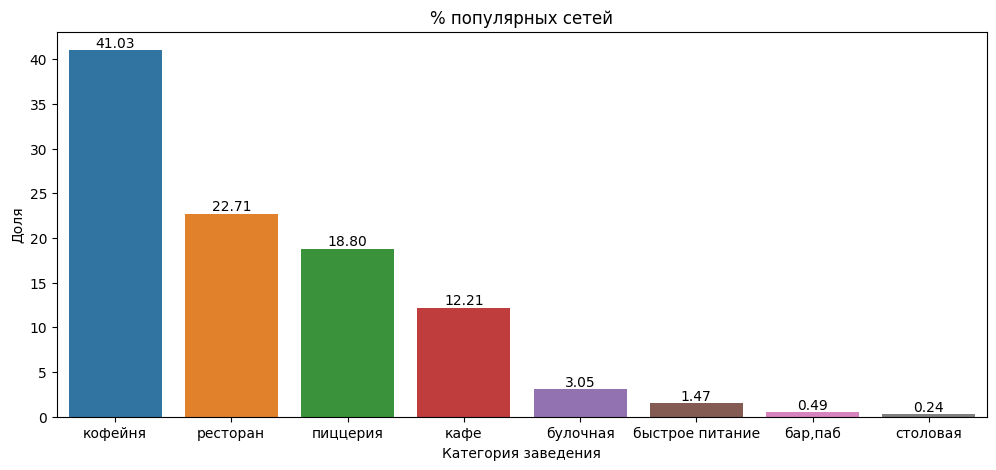

In [39]:
plt.figure(figsize=(12, 5))
ax=sns.barplot(x='category', y='percent,%', data=top_15_to_category, \
            order=top_15_to_category.sort_values(by='percent,%', ascending=False).category)
plt.title('% популярных сетей')
plt.xlabel('Категория заведения')
plt.ylabel('Доля')
ax.bar_label(ax.containers[0], fmt='%.2f');

**Вывод:** среди топ-15 популярных сетей **41 %** относятся к категории "кофейня", также в тройку лидеров вошли "ресторан" - **22,7 %** и "пиццерия" - **18,8 %**. Видим в Топ -15 популярные сети, такие, как "Шоколадница", "Доминос пицца". Также в топ вошла "Яндекс Лавка", вероятно, за счет нее категория "ресторан" может обходить пиццерии, т.к. именно к ней отнесена Яндекс Лавка. Также, обращает на себя внимание отсутсвие самых популярных заведений быстрого питания(напр. "KFC", "BurgerKing", "Вкусно и Точка" и др.).

**Посмотрим данные о каких административных районах Москвы в нашем распоряжении. Оценим общее количество заведений и количество заведений каждой категории по районам.**

In [40]:
places_to_district= places_filtered.groupby(['district','category']) \
    .agg({'name' : 'count'}) \
    .rename(columns= {'name':'count_names'}) \
    .reset_index()\
    .sort_values(by='count_names',ascending=False)

places_to_district['total'] = places_to_district.groupby('district')['count_names'].transform('sum')

places_to_district['percent,%'] = \
round(places_to_district['count_names'] /places_to_district['total']*100,2)
places_to_district

,district,category,count_names,total,"percent,%"
46,Центральный административный округ,ресторан,670,2176,30.79
43,Центральный административный округ,кафе,464,2176,21.32
44,Центральный административный округ,кофейня,428,2176,19.67
40,Центральный административный округ,"бар,паб",298,2176,13.69
51,Юго-Восточный административный округ,кафе,282,707,39.89
...,...,...,...,...,...
32,Северо-Западный административный округ,"бар,паб",19,405,4.69
39,Северо-Западный административный округ,столовая,18,405,4.44
63,Юго-Западный административный округ,столовая,17,703,2.42
49,Юго-Восточный административный округ,булочная,13,707,1.84


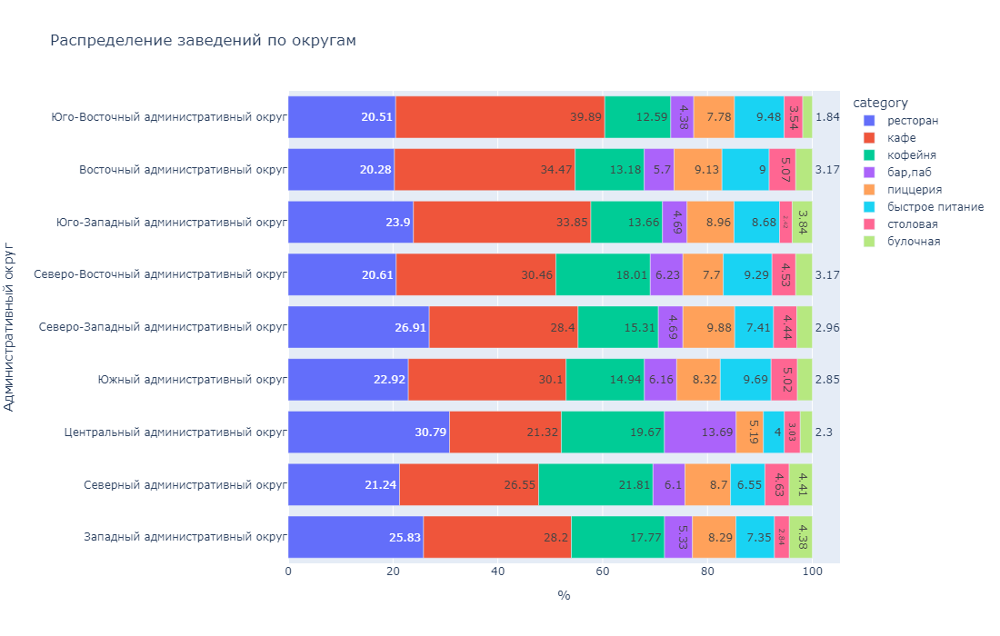

In [41]:
fig = px.bar(places_to_district, x="percent,%", y="district",\
             color ='category',text_auto='percent,%',width=1100,height =700,\
             labels={
                     "district": "Административный округ",
                     "percent,%": "%",
                 },
                title="Распределение заведений по округам")
fig.update_layout(yaxis={'categoryorder':'total ascending'})
fig.show();


**Вывод:** подавляющее число заведений находится в **ЦАО - 2176.** Наименьшее число заведений находится в **СЗАО - 405.**
Во всех районах, кроме ЦАО лидером среди категорий является "кафе", 3-ю позицию занимает "ресторан" или "кофейня". 
Однако, **ЦАО** -  единственный район, где подавляющее число заведений относятся к категории **"ресторан"(30,79 %).**

**Посмотрим как распределяется средний рейтинг по категориям заведений. Велико ли отличие?**

,category,rating
0,"бар,паб",4.358044
1,пиццерия,4.301109
2,ресторан,4.290495
3,кофейня,4.277337
4,булочная,4.268359
5,столовая,4.211429
6,кафе,4.123896
7,быстрое питание,4.050249


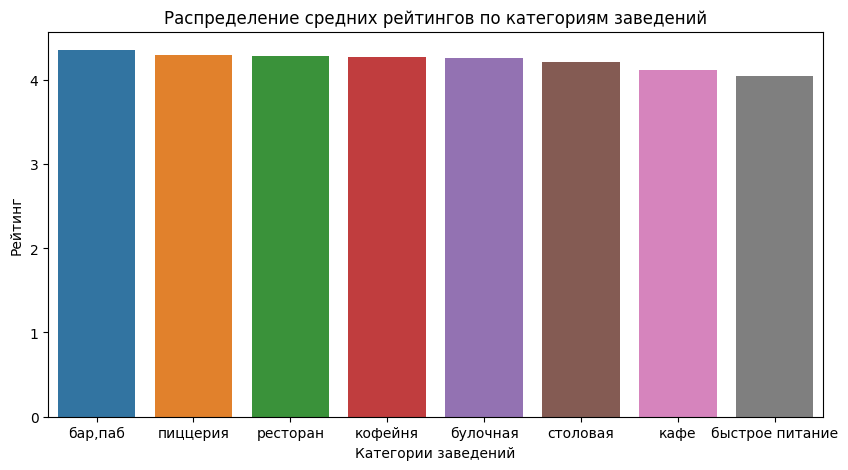

In [42]:
rating_to_category = places_filtered.groupby('category')\
    .agg({'rating':'mean'}).sort_values(by='rating',ascending=False).reset_index()
display(rating_to_category)

plt.figure(figsize=(10, 5))
sns.barplot(x='category', y='rating', data=rating_to_category)
plt.title('Распределение средних рейтингов по категориям заведений')
plt.xlabel('Категории заведений')
plt.ylabel('Рейтинг')
plt.show()

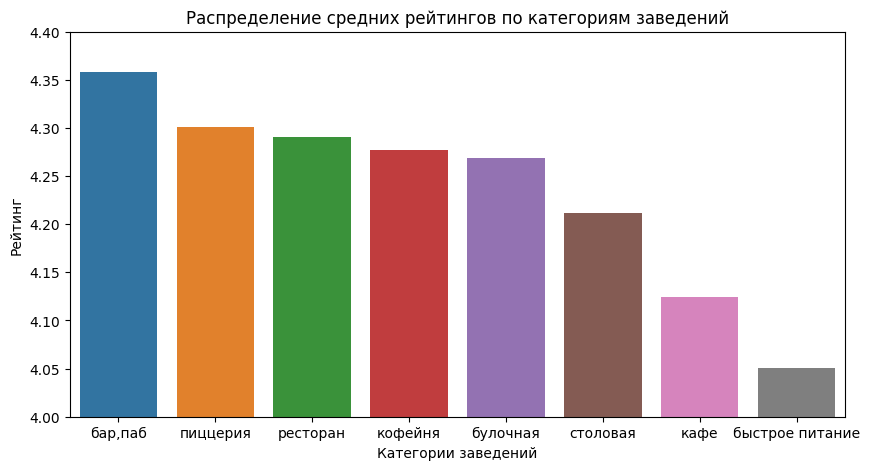

In [43]:
# посмотри в другом масмтабе для более точной оценки
plt.figure(figsize=(10, 5))
ax=sns.barplot(x='category', y='rating', data=rating_to_category)
plt.title('Распределение средних рейтингов по категориям заведений')
plt.xlabel('Категории заведений')
plt.ylabel('Рейтинг')
plt.ylim(4,4.4)
# ax.bar_label(ax.containers[0], fmt='%.2f')
plt.show()

**Вывод:** в лидерах по рейтингу заведения категории **"бар, паб"**, что, не исключено, связано и со спецификой категории. Далее с небольшим отрыво следует **"пиццерия" и "ресторан"**, следующая 'пара' - "кофейня" и "булочная". В **аутсайдерах "быстрое питание"**. Но, стоит отметить, что средний рейтинг у всех категорий более 4-х.

**Посмотрим как рейтинг заведений распределен по городу, в разных округах.**

In [44]:
rating_by_district = places_filtered.groupby('district', as_index=False)['rating'].agg('mean')
rating_by_district.sort_values(by='rating',ascending=False)

,district,rating
5,Центральный административный округ,4.371278
2,Северный административный округ,4.236497
4,Северо-Западный административный округ,4.204938
8,Южный административный округ,4.180160
1,Западный административный округ,4.179858
0,Восточный административный округ,4.171229
7,Юго-Западный административный округ,4.170270
3,Северо-Восточный административный округ,4.145527
6,Юго-Восточный административный округ,4.096605


In [45]:
# читаем файл и сохраняем в переменной
import json

try:
    with open('admin_level_geomap.geojson', 'r', encoding='utf-8') as file:
        our_file = json.load(file)
except FileNotFoundError:
    our_file = '/datasets/admin_level_geomap.geojson'

In [46]:
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = 'admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=our_file,
    data=rating_by_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

m

# выводим карту

**Вывод:** заведения с самым высоким рейтингом располагаются в самом центре столице - **ЦАО.** Также обращает на себя внимания аутсайдер, единственный в диапазоне рейтинга 4.10-4.14 - **ЮВАО.**

**Посмотрим на распределение всех имеющихся заведений по городу.**

In [47]:
from folium import Marker
from folium.plugins import MarkerCluster

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
places_filtered.apply(create_clusters, axis=1)

# выводим карту
m

**Найдем топ-15 улиц по количеству заведений. Построим график распределения количества заведений и их категорий по этим улицам**

,street_name,count_places
0,проспект Мира,182
1,Профсоюзная улица,122
2,проспект Вернадского,107
3,Ленинский проспект,106
4,Ленинградский проспект,92
5,Дмитровское шоссе,87
6,Каширское шоссе,75
7,Варшавское шоссе,74
8,Ленинградское шоссе,69
9,МКАД,65


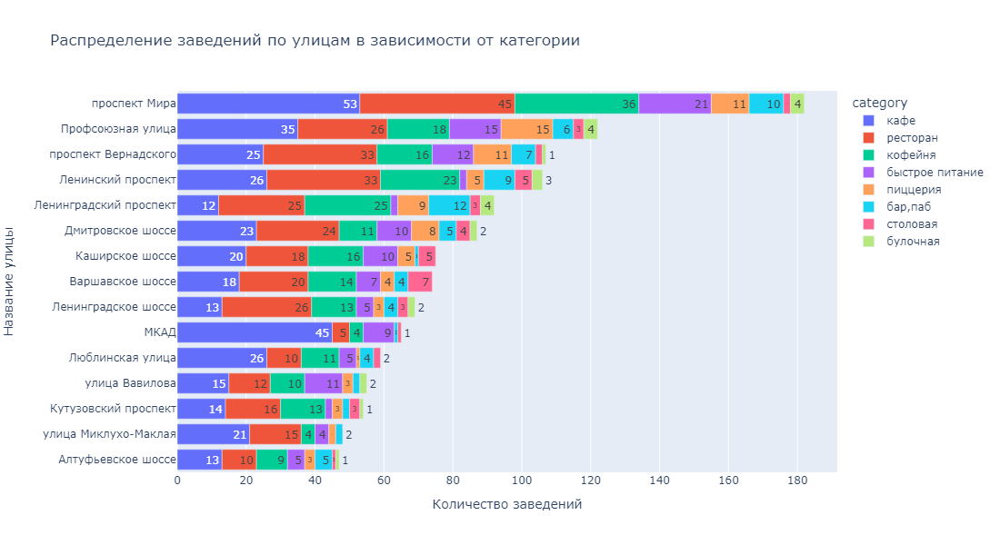

In [48]:
places_to_street_top_15 = places_filtered.groupby('street_name') \
    .agg({'name': 'count'}) \
    .rename(columns={'name':'count_places'}) \
    .sort_values(by='count_places',ascending=False).head(15)\
    .reset_index()
display(places_to_street_top_15)


places_to_category_top15 = places_filtered[places_filtered['street_name'].isin(places_to_street_top_15['street_name'].unique())]
places_to_category_top15
places_to_category_top15 = places_to_category_top15.groupby(['street_name','category'])['name'].count().reset_index(). \
sort_values(by='name',ascending=False)



fig = px.bar(places_to_category_top15, x="name", y="street_name", color="category",text_auto=True,width=1100,height =600,\
             labels={
                     "street_name": "Название улицы",
                     "name": "Количество заведений",
                 },
                title="Распределение заведений по улицам в зависимости от категории")
fig.update_layout(yaxis={'categoryorder':'total ascending'})
fig.show()



**Вывод:** абсолютным лидером по кол-ву заведений является **Проспект Мира** (ЦАО, СВАО). БОльшая часть заведений там относится к категории "кафе", на 2-ом месте - "ресторан". Следующие три улицы - Профсоюзная улица, проспект Вернадского, Ленинский проспект - "представители" ЮЗАО. И если на Профсоюзной улице преобладают кафе, то на 2-ух других - рестораны.

Вспомним, что средний рейтинг ниже других в СВАО, а средний рейтинг по категориям -  2-ой с конца  - у кафе. Заведений именно этой категории больше всего на улице - лидере топ-15 и располагается она, частично, в СВАО.

**Найдем улицы, на которых находится только одно заведение.**

,street_name,count_places
0,1-й Автозаводский проезд,1
1,Одинцовская улица,1
2,Октябрьский переулок,1
3,Ордынский тупик,1
4,Оренбургская улица,1
...,...,...
457,16-я Парковая улица,1
458,1-й Варшавский проезд,1
459,1-й Балтийский переулок,1
460,1-й Вешняковский проезд,1


,district,category,street_count
39,Центральный административный округ,кафе,40
42,Центральный административный округ,ресторан,37
40,Центральный административный округ,кофейня,35
36,Центральный административный округ,"бар,паб",23
59,Южный административный округ,кафе,22
...,...,...,...
23,Северо-Восточный административный округ,"бар,паб",1
17,Северный административный округ,быстрое питание,1
15,Северный административный округ,"бар,паб",1
14,Западный административный округ,столовая,1


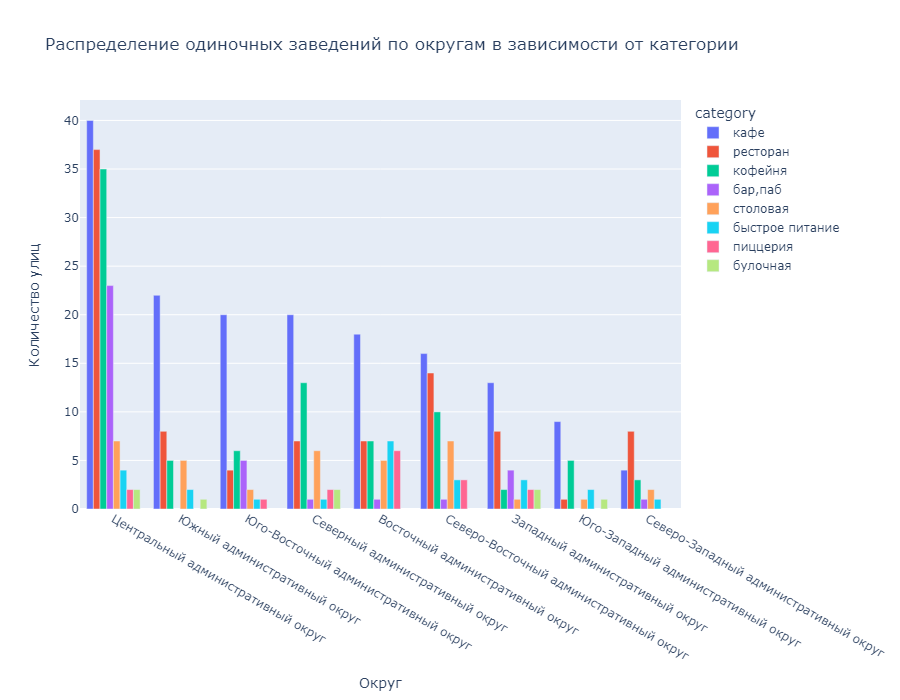

In [49]:
for_one_on_street = places_filtered.groupby('street_name') \
    .agg({'name': 'count'}) \
    .rename(columns={'name':'count_places'}) \
    .sort_values(by='count_places',ascending=True)\
    .reset_index()


one_on_street = for_one_on_street.query('count_places == 1')
display(one_on_street)


places_one_on_street = places_filtered[places_filtered['street_name'].isin(one_on_street['street_name'])]
places_one_on_street


places_to_district_and_category_one_on_street = places_one_on_street.groupby(['district', 'category']) \
    .agg({'street_name': 'count'}) \
    .rename(columns={'street_name':'street_count'})\
    .reset_index() \
    .sort_values(by='street_count',ascending=False)
display(places_to_district_and_category_one_on_street)

fig = px.bar(places_to_district_and_category_one_on_street, x="district", y="street_count", color="category", barmode = 'group', width=900,height =700,\
             labels={
                     "street_count": "Количество улиц",
                     "district": "Округ",
                 },
                title="Распределение одиночных заведений по округам в зависимости от категории")
fig.show()

**Вывод:** самое большое кол-во "одиночек" в ЦАО. Возможно, его узкие, маленькие улочки располагают к этому. Среди категорий для "одиночек" преобладает "кафе", за исключением СЗАО.

**Посмотрим на распределение среднего чека по округам. Проанализируем цены в ЦАО и других округах. Узнаем, как удалённость от центра влияет на цены в заведениях.**


In [50]:
middle_avg_bill_by_district = places_filtered.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
middle_avg_bill_by_district


m_2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=our_file,
    data=middle_avg_bill_by_district,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.8,
    legend_name='Медианный средний счет заведений по районам',
).add_to(m_2)

m_2

# выводим карту

**Вывод:** Ожидаемо, наиболее высокий средний чек в ЦАО. Однако, обратим внимние на ЗАО,где средний чек в них аналогичен ЦАО. Наиболее низкий средний чек на юге - ЮВАО, ЮАО, а, также в СВАО. Т.е. мы видим зависимость от округа, но не прямую зависимость от удаленности от центра.

**ОБЩИЙ ВЫВОД:**

* В нашем распоряжении 8 категорий заведений:

кафе,
ресторан,
кофейня,
бар/паб,
пиццерия,
быстрое питание,
столовая,
булочная.

* Лидер по количеству - заведения категории "кафе", с небольшим отставанием, на втором месте - "ресторан". Наименьшее число заведений представлено в категориях - "столовая" и "булочная".


* При общей оценке посадочных мест по категориям лидирует "бар,паб", догоняет - "ресторан". Однако, при оценке в разрезе сетевые/несетевые заведения наибольшее количество мест у сетевых "ресторанов" и "кофейн".


* В датасете бОльшая часть представленных заведений НЕсетевые, а именно в соотношении - 61,5 % к 38,5 %.


* Сетевые заведения преобладают только в категории "булочная" (~ 61 %), для категории "пиццерия" и "кофейня" соотношение ~ 50/50; для категорий "кафе" и "ресторан" сетевых ~ 1/3. По абсолютному количеству лидирует "кафе".


* Среди топ-15 популярных сетей 41 % относятся к категории "кофейня", также в тройку лидеров вошли "ресторан" - 22,7 % и "пиццерия" - 18,8 %. Видим в Топ -15 популярные сети, такие, как "Шоколадница", "Доминос пицца". Также в топ вошла "Яндекс Лавка", вероятно, за счет нее категория "ресторан" может обходить пиццерии, т.к. именно к ней отнесена Яндекс Лавка. Также, обращает на себя внимание отсутсвие самых популярных заведений быстрого питания(напр. "KFC", "BurgerKing", "Вкусно и Точка" и др.).


* Подавляющее число заведений находится в **ЦАО - 2176.** Наименьшее число заведений находится в **СЗАО - 405.** Во всех районах, кроме ЦАО лидером среди категорий является "кафе", 3-ю позицию занимает "ресторан" или "кофейня". Однако, **ЦАО** -  единственный район, где подавляющее число заведений относятся к категории **"ресторан"(30,79 %).**



* В лидерах по рейтингу заведения категории "бар, паб", что, не исключено, связано и со спецификой категории. Далее с небольшим отрыво следует "ресторан" и "пиццерия", следующая 'пара' - "кофейня" и "булочная". В аутсайдерах "быстрое питание". Но, стоит отметить, что средний рейтинг у всех категорий более 4-х.


* Заведения с самым высоким рейтингом располагаются в самом центре столице - **ЦАО.** Также обращает на себя внимания аутсайдер, единственный в диапазоне рейтинга 4.10-4.14 - **ЮВАО.**



* Абсолютным лидером по кол-ву заведений является Проспект Мира (ЦАО, СВАО). БОльшая часть заведений там относится к категории "кафе", на 2-ом месте - "ресторан". Следующие три улицы - Профсоюзная улица, проспект Вернадского, Ленинский проспект - "представители" ЮЗАО. И если на Профсоюзной улице преобладают кафе, то на 2-ух других - рестораны.


Вспомним, что средний рейтинг в СВАО - 2ой с конца и  средний рейтинг по категориям - 2-ой с конца - у кафе. Заведений именно этой категории больше всего на улице - лидере топ-15 и располагается она, частично, в СВАО.


* Самое большое кол-во "одиночек" в ЦАО. Возможно, его узкие, маленькие улочки располагают к этому. Среди категорий для "одиночек" преобладает "кафе", за исключением СЗАО.


* Ожидаемо, наиболее высокий средний чек в ЦАО. Однако, мы видим зависимость среднего чека от округа, а не от удаленности от центра.

#### Шаг 4. Детализация исследования. Цель - формирование рекомендаций по открытию кофейни.

**Посмотрим сколько всего кофеен в датасете, в каких районах их больше всего, каковы особенности их расположения.**

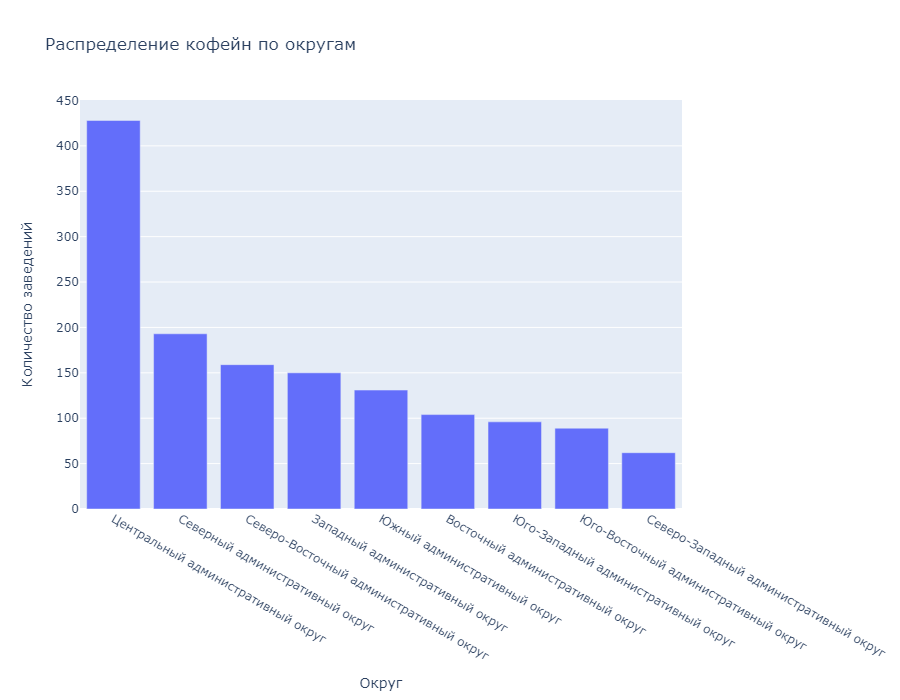

In [51]:
cafes = places_filtered.groupby(['category', 'district']).agg({'name': 'count'}).reset_index()
cafes = cafes.query('category == "кофейня"')
cafes


fig = px.bar(cafes, x="district", y="name", barmode = 'group', width=900,height =700,\
             labels={
                     "name": "Количество заведений",
                     "district": "Округ",
                 }, 
                
                title="Распределение кофейн по округам")
fig.update_layout(xaxis={'categoryorder':'total descending'})
fig.show()

In [52]:
cafes_total = cafes.groupby('district') \
    .agg({'name': 'sum'}) \
    .rename(columns={'name': 'count_total'}) \
    .sort_values(by='count_total', ascending=False ) \
    .reset_index()
display(cafes_total)
display(cafes_total['count_total'].sum())

,district,count_total
0,Центральный административный округ,428
1,Северный административный округ,193
2,Северо-Восточный административный округ,159
3,Западный административный округ,150
4,Южный административный округ,131
5,Восточный административный округ,104
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


1412

In [53]:
# посмотрим на распределение кофейн по округам
m_3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=our_file,
    data=cafes_total,
    columns=['district', 'count_total'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.8,
    legend_name='"Распределение кофейн по округам"',
).add_to(m_3)

m_3

**Вывод:** Общее число кофейн - **1412**. Абсолютный лидер по количеству кофейн - ЦАО. Наиболее "свободные округа" в отношении кофейн - СЗАО, ЮВАО, ЮЗАО, ВАО. Отметим высокую плотность заведений ЗАО, там, где средний чек аналогичен центральному округу.

**Посмотрим, есть ли кофейни, имеющие круглосуточный режим работы.**

In [54]:
cafes_time = places_filtered[(places_filtered['is_24/7'] == True) & \
                             (places_filtered['category'] == "кофейня")]
cafes_time

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street_name,is_24/7
200,wild bean,кофейня,"Москва, Дмитровское шоссе, 107Е",Северный административный округ,"ежедневно, круглосуточно",55.878477,37.543426,3.5,высокие,NaN,NaN,NaN,True,20.0,Дмитровское шоссе,True
971,wild bean cafe,кофейня,"Москва, Ярославское шоссе, 116",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.867822,37.708853,4.0,высокие,NaN,NaN,NaN,True,25.0,Ярославское шоссе,True
1047,wild bean cafe,кофейня,"Москва, Ярославское шоссе, вл3с3",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.851778,37.676423,4.5,средние,Цена чашки капучино:140–200 ₽,NaN,170.0,True,NaN,Ярославское шоссе,True
1214,wild bean cafe,кофейня,"Москва, МКАД, 65-й километр, 8",Северо-Западный административный округ,"ежедневно, круглосуточно",55.813787,37.390701,4.3,высокие,NaN,NaN,NaN,True,NaN,МКАД,True
1291,шоколадница,кофейня,"Москва, улица Народного Ополчения, 49, корп. 1",Северо-Западный административный округ,"ежедневно, круглосуточно",55.794815,37.494834,4.2,средние,Средний счёт:650–850 ₽,750.0,NaN,True,200.0,улица Народного Ополчения,True
1468,кофе хауз,кофейня,"Москва, Ленинградский проспект, 74",Северный административный округ,"ежедневно, круглосуточно",55.805239,37.516246,4.0,высокие,Цена чашки капучино:235–335 ₽,NaN,285.0,True,NaN,Ленинградский проспект,True
1790,кофемания,кофейня,"Москва, Ленинградский проспект, 37А, корп. 14,...",Северный административный округ,"ежедневно, круглосуточно",55.790899,37.542776,4.7,высокие,NaN,NaN,NaN,True,15.0,Ленинградский проспект,True
1825,you&coffee,кофейня,"Москва, улица Золоторожский Вал, 11, стр. 21",Северный административный округ,"ежедневно, круглосуточно",55.803924,37.582251,4.2,высокие,NaN,NaN,NaN,True,NaN,улица Золоторожский Вал,True
1883,кофемания,кофейня,"Москва, Лесная улица, 5",Центральный административный округ,"ежедневно, круглосуточно",55.777804,37.586346,4.4,средние,Средний счёт:2000 ₽,2000.0,NaN,True,140.0,Лесная улица,True
2030,cinnabon,кофейня,"Москва, Долгоруковская улица, 40",Центральный административный округ,"ежедневно, круглосуточно",55.778271,37.601991,4.2,высокие,NaN,NaN,NaN,True,230.0,Долгоруковская улица,True


In [55]:
#  мы видим 59 заведений, категории "кофейня", имеющих график работы "ежедневно, круглосуточно"
#  сколько из них сетевых?

display(cafes_time.query('chain == True').count())

name                 50
category             50
address              50
district             50
hours                50
lat                  50
lng                  50
rating               50
price                50
avg_bill             23
middle_avg_bill      10
middle_coffee_cup    13
chain                50
seats                33
street_name          50
is_24/7              50
dtype: int64

**Вывод:** Из 1412 кофейн 59 имеют график "ежедневно, круглосуточно", из этих 59 подавляющее большинство сетевые, а именно - 50.

**Посмотрим, какие у кофеен рейтинги, как они распределяются по округам.**

In [56]:
# посмотрим на мин и макс рейтинг среди кофейн
rating_of_cafe_by_district = places_filtered[places_filtered['category'] == "кофейня"]
print(f' Минимальный рейтинг кофейн: {rating_of_cafe_by_district["rating"].min()}')
print(f' Максимальный рейтинг кофейн: {rating_of_cafe_by_district["rating"].max()}')

 Минимальный рейтинг кофейн: 1.4
 Максимальный рейтинг кофейн: 5.0


In [57]:
# посмотрим на распределение средних рейтингов в категории "кофейня" по округам, возьмем рейтинги выше 4-х
rating_median = rating_of_cafe_by_district.query('rating>4').groupby('district', as_index=False)['rating'].agg('mean')

m_4 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=our_file,
    data=rating_median,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='"Рейтинг кофейн по округам"',
).add_to(m_4)

m_4

ЗАО выделяется на фоне остальных - единственный в самом низком диапазоне рейтинга.Попробуем разобраться с рейтингом более детально.

In [58]:
# прицельнее изучим заведения с низким рейтингом; посмотрим сколько всего кофейн с рейтингом ниже 4-х
low_rating = rating_of_cafe_by_district.query('rating < 4')
low_rating = low_rating.groupby('district').agg({'rating':'count'}).sort_values(by='rating', ascending=False)
print(low_rating['rating'].sum())
low_rating

138


,rating
district,
Западный административный округ,27
Северный административный округ,22
Северо-Восточный административный округ,21
Восточный административный округ,14
Юго-Восточный административный округ,14
Южный административный округ,14
Юго-Западный административный округ,11
Центральный административный округ,10
Северо-Западный административный округ,5


Итак, всего кофейн с рейтингом ниже 4-х(учитывая медианный, примем за низкий все, что ниже 4-х) - 138. Если смотреть на абсолютные значения в лидерах по низкому рейтингу - ЗАО, САО и СВАО. Но, корректнее, будет посмотреть на доли от общего кол-ва. 

In [59]:
# посмотрим какова доля кофейн с рейтингом ниже 4-х в каждом округе
how_many_low = cafes_total.merge(low_rating,left_on ='district', right_on = 'district', how ='inner')
how_many_low['part_of_low'] = round(how_many_low['rating'] / how_many_low['count_total'] *100,2)
how_many_low

,district,count_total,rating,part_of_low
0,Центральный административный округ,428,10,2.34
1,Северный административный округ,193,22,11.40
2,Северо-Восточный административный округ,159,21,13.21
3,Западный административный округ,150,27,18.00
4,Южный административный округ,131,14,10.69
5,Восточный административный округ,104,14,13.46
6,Юго-Западный административный округ,96,11,11.46
7,Юго-Восточный административный округ,89,14,15.73
8,Северо-Западный административный округ,62,5,8.06


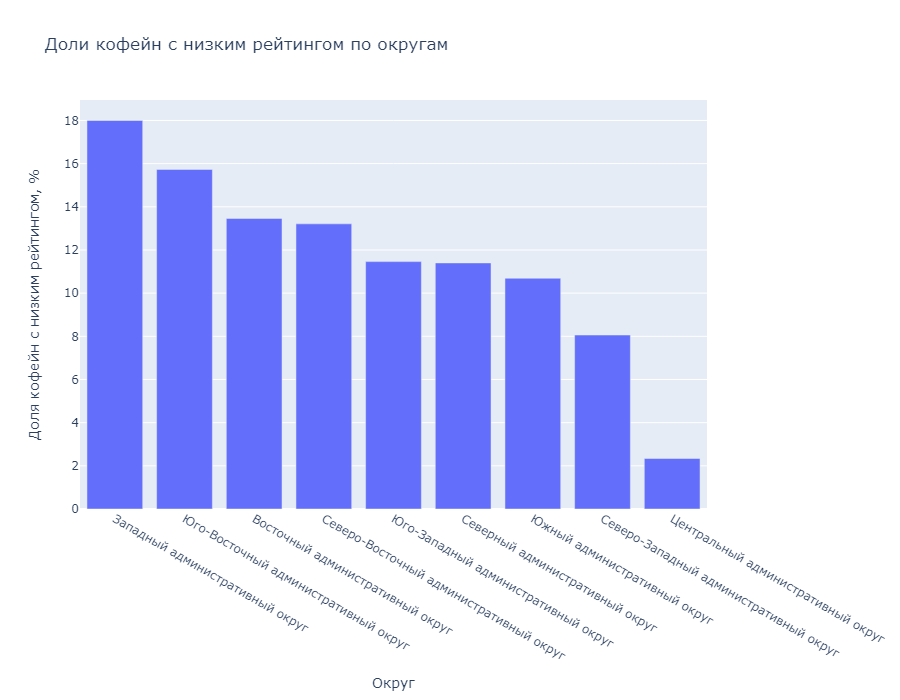

In [60]:
fig = px.bar(how_many_low, x="district", y="part_of_low", barmode = 'group', width=900,height =700,\
             labels={
                     "part_of_low": "Доля кофейн с низким рейтингом, %",
                     "district": "Округ",
                 },
                
                title="Доли кофейн с низким рейтингом по округам")
fig.update_layout(xaxis={'categoryorder':'total descending'})
fig.show()

**Вывод:** 

* Минимальный рейтинг кофейн: 1.4;
* Максимальный рейтинг кофейн: 5.0;
* Самый низкий средний рейтинг(для кофейн с рейтингом >4) у ЗАО;
* По доле кофейн,с рейтингом ниже 4-х, от общего число в округе лидируют: ЗАО и ЮВАО.

**Посмотрим на диапозон стоимости чашки капучино, чтобы определиться в дальнейшем - на какую стоимость чашки капучино стоит ориентироваться при открытии и почему?**

In [61]:
middle_coffee_cup_by_district = places_filtered.groupby('district', as_index=False)['middle_coffee_cup'] \
    .agg('median') \
    .rename(columns={'middle_coffee_cup' : 'median_price'}) \
    .sort_values(by= 'median_price',ascending=False)
display(middle_coffee_cup_by_district)

,district,median_price
7,Юго-Западный административный округ,197.0
5,Центральный административный округ,190.0
1,Западный административный округ,187.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
4,Северо-Западный административный округ,150.0
8,Южный административный округ,149.5
6,Юго-Восточный административный округ,145.0
0,Восточный административный округ,135.0


In [62]:
m_5 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=our_file,
    data=middle_coffee_cup_by_district,
    columns=['district', 'median_price'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.8,
    legend_name='Медианный средний счет за чашку капучино по округам',
).add_to(m_5)

m_5

# выводим карту

Вспомнив первую часть исследования отметим, что лидеры по среднему счету лидируют и по медианной цене за чашку капучино - ЦАО и ЗАО, НО к ним добавился еще и ЮЗАО и здесь он лидер с небольшим отрывом - 197 руб./за чашку.

### Общие выводы по проведенному исследованию:

##### Часть 1  - исследование рынка заведений г.Москва во всех категориях

* В нашем распоряжении 8 категорий заведений:

кафе,
ресторан,
кофейня,
бар/паб,
пиццерия,
быстрое питание,
столовая,
булочная.

 В нашем распоряжении 8 категорий заведений:

кафе,
ресторан,
кофейня,
бар/паб,
пиццерия,
быстрое питание,
столовая,
булочная.

* Лидер по количеству - заведения категории "кафе", с небольшим отставанием, на втором месте - "ресторан". Наименьшее число заведений представлено в категориях - "столовая" и "булочная".


* При общей оценке посадочных мест по категориям лидирует "бар,паб", догоняет - "ресторан". Однако, при оценке в разрезе сетевые/несетевые заведения наибольшее количество мест у сетевых "ресторанов" и "кофейн".


* В датасете бОльшая часть представленных заведений НЕсетевые, а именно в соотношении - 61,5 % к 38,5 %.


* Сетевые заведения преобладают только в категории "булочная" (~ 61 %), для категории "пиццерия" и "кофейня" соотношение ~ 50/50; для категорий "кафе" и "ресторан" сетевых ~ 1/3. По абсолютному количеству лидирует "кафе".


* Среди топ-15 популярных сетей 41 % относятся к категории "кофейня", также в тройку лидеров вошли "ресторан" - 22,7 % и "пиццерия" - 18,8 %. Видим в Топ -15 популярные сети, такие, как "Шоколадница", "Доминос пицца". Также в топ вошла "Яндекс Лавка", вероятно, за счет нее категория "ресторан" может обходить пиццерии, т.к. именно к ней отнесена Яндекс Лавка. Также, обращает на себя внимание отсутсвие самых популярных заведений быстрого питания(напр. "KFC", "BurgerKing", "Вкусно и Точка" и др.).


* Подавляющее число заведений находится в **ЦАО - 2176.** Наименьшее число заведений находится в **СЗАО - 405.** Во всех районах, кроме ЦАО лидером среди категорий является "кафе", 3-ю позицию занимает "ресторан" или "кофейня". Однако, **ЦАО** -  единственный район, где подавляющее число заведений относятся к категории **"ресторан"(30,79 %).**



* В лидерах по рейтингу заведения категории "бар, паб", что, не исключено, связано и со спецификой категории. Далее с небольшим отрыво следует "ресторан" и "пиццерия", следующая 'пара' - "кофейня" и "булочная". В аутсайдерах "быстрое питание". Но, стоит отметить, что средний рейтинг у всех категорий более 4-х.


* Заведения с самым высоким рейтингом располагаются в самом центре столице - **ЦАО.** Также обращает на себя внимания аутсайдер, единственный в диапазоне рейтинга 4.10-4.14 - **ЮВАО.**



* Абсолютным лидером по кол-ву заведений является Проспект Мира (ЦАО, СВАО). БОльшая часть заведений там относится к категории "кафе", на 2-ом месте - "ресторан". Следующие три улицы - Профсоюзная улица, проспект Вернадского, Ленинский проспект - "представители" ЮЗАО. И если на Профсоюзной улице преобладают кафе, то на 2-ух других - рестораны.


Вспомним, что средний рейтинг в СВАО - 2ой с конца и  средний рейтинг по категориям - 2-ой с конца - у кафе. Заведений именно этой категории больше всего на улице - лидере топ-15 и располагается она, частично, в СВАО.


* Самое большое кол-во "одиночек" в ЦАО. Возможно, его узкие, маленькие улочки располагают к этому. Среди категорий для "одиночек" преобладает "кафе", за исключением СЗАО.


* Ожидаемо, наиболее высокий средний чек в ЦАО. Однако, мы видим зависимость среднего чека от округа, а не от удаленности от центра.

##### Часть 2 - исследование рынка заведений г.Москва в категории "кофейня"

*  Общее число кофейн - 1412. Абсолютный лидер по количеству кофейн - ЦАО. Наиболее "свободные округа" в отношении кофейн - СЗАО, ЮВАО, ЮЗАО, ВАО. Отметим высокую плотность заведений ЗАО, там, где средний чек аналогичен центральному округу.

* Вывод: Из 1412 кофейн 59 имеют график "ежедневно, круглосуточно", из этих 59 подавляющее большинство сетевые, а именно - 50.

* Минимальный рейтинг кофейн: 1.4
* Максимальный рейтинг кофейн: 5.0

* Самый низкий средний рейтинг(для кофейн с рейтингом >4) у ЗАО;

* Кофейн с рейтингом ниже 4-х - 138.

* По доле кофейн,с рейтингом ниже 4-х, от общего число в округе лидируют: ЗАО и ЮВАО.

* Медианная средняя цена за чашку капучино в диапазоне 135.0 - 197.0. Отметим, что лидеры по среднему счету лидируют и по медианной цене за чашку капучино - ЦАО и ЗАО, НО к ним добавился еще и ЮЗАО и здесь он лидер с небольшим отрывом - 197 руб./за чашку.

На основании проведенного исследования выбор места для открытия кофейни может складываться из следующих факторов: 
    
- выбор одного из "свободных" округов,
- выбор округа/улицы в пешей доступности до лесопарковых зон/учебных заведений,
- выбор округа с не самыми высокими рейтингами, для возможности составить конкуренцию,
- при формировании ценовой политики учитывать цены по округу( возможно, сделать их немного выше, но привлечь клиентов акциями).


Можно остановиться на двух округах: 

* ЮЗАО, пересечение района Тропарево - Никулино/Обручево/Коньково.

* СЗАО, район Хорошево - Мневники.

Предварительно оценить:

- проходимость,
- наличие подходящего для аренды места,
- ассортимент рядом находящихся кофейн.